# Исследование гео-чеков

### Imports

In [1]:
# %%capture
# pip install geopandas folium mapclassify

In [ ]:
# %%capture
# pip install h3==3.7.7

In [2]:
import requests
import json
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from mapclassify import NaturalBreaks

import geopandas as gpd
from shapely import wkt
from shapely.geometry import Polygon
import folium 

import h3

In [36]:
sns.set_style('whitegrid')

## Сбор данных

### Парсим Геочеки от ФНС на Московскую агломерацию

[Источник данных](https://geochecki-vpd.nalog.gov.ru/geochecks)

#### Описание данных

1. На странице представлено агрегированное распределение трат населения в различных точках на карте РФ. Цветовая гамма шестиугольников, наложенных на карту, соответствует изменению интенсивности выручки, чем "теплее" цвет, тем больше общая сумма реализации товаров и услуг. Объем продаж товаров и услуг происходит через контрольно-кассовую технику (ККТ) в данном местоположении.
2. Интенсивность выручки рассчитывается отдельно для каждого субъекта РФ или города миллионника. Благодаря этому можно сравнивать между собой шестиугольники в одном субъекте РФ или городе миллионнике.
3. Расчет метрик происходит для всех чеков с товарами и услугами по всем ККТ, попавшим в шестиугольник. Метрики рассчитываются за последнюю полную календарную неделю. В случае, если метрика попадает под действие статьи 102 НК РФ вместо показателя выводится значение "N/A"
4. Результатом работы алгоритма по расчету показателей являются агрегированные, деперсонифицированные данные. Данные рассчитываются на основе чеков ККТ и предоставлены как есть. ФНС России не несет ответственности за использование данных презентационной аналитики.

#### Парсинг

In [3]:
url = "https://geochecki-vpd.nalog.gov.ru/api/Metrics/bounds"

querystring = {"NorthEast":["4438662.4020453105","7701773.471028059"],
               "SouthWest":["3913998.6399688944","7316530.848524405"],
               "H3Resolution":"8"}

payload = ""
response = requests.request("GET", url, data=payload, params=querystring)

features = response.json()["features"]

In [4]:
features[0]

{'type': 'Feature',
 'geometry': {'type': 'Polygon',
  'coordinates': [[[37.099777926, 54.88778235],
    [37.104127622, 54.883858775],
    [37.111832961, 54.884328314],
    [37.115190053, 54.888721755],
    [37.110840474, 54.892645781],
    [37.103133687, 54.892175914],
    [37.099777926, 54.88778235]]]},
 'properties': {'Id': 'ac0c9890-1184-11f0-bb0a-005056a0313a',
  'H3Id': '881181d709fffff',
  'KktCount': [6, 10],
  'AverageBill': [1141, 1003],
  'TruncatedAverageBill': [607, 525],
  'MedianBill': [460, 320],
  'CacheBillPercent': [39, 30],
  'CachePayPercent': [22, 33],
  'IntensityOfNumberBills': 8,
  'RevenueIntensity': 9,
  'PeriodStart': '2025-03-17T00:00:00',
  'PeriodEnd': '2025-03-23T23:59:59',
  'IsMall': False,
  'IsRare': False,
  'IsEcommerce': False,
  'TopCategories': ['Товары повседневного спроса',
   'Туристические услуги',
   'Кафе и рестораны'],
  'Title': 'Калужская область, Жуковский район, Кремёнки, Осенняя улица',
  'ActiveHours': [0,
   0,
   0,
   0,
   0,
  

In [5]:
def convert_to_gdf(data):
    geo_data = []
    for feature in features:
        coords = feature['geometry']['coordinates'][0]
        polygon = Polygon(coords)
        properties = feature['properties']
        properties['geometry'] = polygon
        geo_data.append(properties)
    
    gdf = gpd.GeoDataFrame(geo_data)
    gdf.crs = "EPSG:4326"
    
    return gdf

In [6]:
gdf = convert_to_gdf(features)

In [7]:
gdf.explore()

In [9]:
gdf.head()

,Id,H3Id,KktCount,AverageBill,TruncatedAverageBill,MedianBill,CacheBillPercent,CachePayPercent,IntensityOfNumberBills,RevenueIntensity,PeriodStart,PeriodEnd,IsMall,IsRare,IsEcommerce,TopCategories,Title,ActiveHours,ReceiptTotalCount,geometry
0,ac0c9890-1184-11f0-bb0a-005056a0313a,881181d709fffff,"[6, 10]","[1141, 1003]","[607, 525]","[460, 320]","[39, 30]","[22, 33]",8,9,2025-03-17T00:00:00,2025-03-23T23:59:59,False,False,False,"[Товары повседневного спроса, Туристические ус...","Калужская область, Жуковский район, Кремёнки, ...","[0, 0, 0, 0, 0, 0, 0, 0.1, 3.1, 3.6, 5.9, 8.4,...",4734,"POLYGON ((37.09978 54.88778, 37.10413 54.88386..."
1,a3f70574-1183-11f0-9565-005056a0313a,88118ddb29fffff,"[3, 13]",None,None,None,None,None,6,5,2025-03-17T00:00:00,2025-03-23T23:59:59,False,False,False,None,"Владимирская область, Кольчугинский район, пос...","[0, 0, 0, 0, 0, 0, 0, 1.5, 6.4, 7.2, 6.9, 7.6,...",887,"POLYGON ((39.22729 56.36132, 39.23167 56.35733..."
2,abf8db16-1184-11f0-bb0a-005056a0313a,8811819223fffff,"[2, 10]",None,None,None,None,None,7,7,2025-03-17T00:00:00,2025-03-23T23:59:59,False,False,False,None,"Россия, Калужская область, Жуковский район, де...","[0, 0, 0, 0, 0, 0, 0, 0, 0.4, 5.6, 7.4, 8, 10....",1115,"POLYGON ((36.93219 55.20809, 36.93658 55.20419..."
3,a4017504-1183-11f0-9565-005056a0313a,8811ab4d27fffff,"[2, 13]",None,None,None,None,None,9,7,2025-03-17T00:00:00,2025-03-23T23:59:59,False,False,False,None,"Россия, Владимирская область, Александровский ...","[0.1, 0, 0, 0.8, 6.1, 10.4, 12, 5.6, 9.2, 5.4,...",5810,"POLYGON ((38.56515 56.37869, 38.56957 56.37474..."
4,abf9cd0a-1184-11f0-bb0a-005056a0313a,881181931bfffff,"[1, 10]",None,None,None,None,None,5,5,2025-03-17T00:00:00,2025-03-23T23:59:59,False,False,False,None,"Калужская область, Жуковский район, деревня Ол...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 2.8, 0.3, 15.3, 10...",286,"POLYGON ((36.93426 55.19149, 36.93865 55.18758..."


In [10]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7913 entries, 0 to 7912
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Id                      7913 non-null   object  
 1   H3Id                    7913 non-null   object  
 2   KktCount                7913 non-null   object  
 3   AverageBill             3305 non-null   object  
 4   TruncatedAverageBill    3305 non-null   object  
 5   MedianBill              3305 non-null   object  
 6   CacheBillPercent        3301 non-null   object  
 7   CachePayPercent         3302 non-null   object  
 8   IntensityOfNumberBills  7913 non-null   int64   
 9   RevenueIntensity        7913 non-null   int64   
 10  PeriodStart             7913 non-null   object  
 11  PeriodEnd               7913 non-null   object  
 12  IsMall                  7913 non-null   bool    
 13  IsRare                  7913 non-null   bool    
 14  IsEcommerce     

#### Описание столбцов

- **H3Id** - уникальный ID ячейки по H3 [https://www.kontur.io/blog/why-we-use-h3/ ]
- **KktCount** – количество ККТ в ячейке
- **AverageBill** - средний чек
- **TruncatedAverageBill** – усеченный средний чек (между 10м и 90м процентилями)
- **MedianBill** – медианный чек
- **CacheBillPercent** – процент от суммарного числа чеков, который были оплачены наличными (в числе чеков)
- **CachePayPercent** - процент от суммы всех продаж, которые были оплачены наличными (в сумме денег)
- **IntensityOfNumberBills** – интенсивность по числу чеков, оцененная таким образом: "Число от 1 до 10. Количество чеков ККТ в выбранном гексе относительно других гексов в данном Субъекте РФ. Чем больше значение - тем выше количество. Например, значение 5 означает, что абсолютное количество чеков в данном гексе больше чем в 40% гексов (со значениями интенсивности 4 и меньше) и меньше чем в 50% гексов (со значениями интенсивности 6 и выше) в данном Субъекте РФ."
- **RevenueIntensity** – интенсивность по выручке, оцененная таким образом: "Число от 1 до 10. Сумма всех продаж товаров и услуг через ККТ в выбранном гексе относительно других гексов в данном Субъекте РФ. Чем больше значение - тем выше сумма. Например, значение 5 означает, что абсолютная сумма в данном гексе больше чем в 40% гексов (со значениями интенсивности 4 и меньше) и меньше чем в 50% гексов (со значениями интенсивности 6 и выше) в данном субъекте РФ."
- **PeriodStart** и **PeriodEnd** – дата начала и окончания сбора данных (неделя)
- **IsMall, IsRare, IsEcommerce**  – нет описания, но видимо означает, что в ячейке есть большой торговый центр, что-то еще и электронная коммерция
- **TopCategories** – три главных категории бизнеса 
- **Title** – заголовок с адресом
- **ReceiptTotalCount** - общее число чеков
- **ActiveHours** – интенсивность чего-то по часам (либо выручки либо числа чеков, но скорее всего выручки) в условных единицах

#### Обработка

В некоторых столбцах помимо значения в данной ячейке указано также среднее значение во всем регионе. Таким образом столбец содержит список из двух значений – очистим его и оставим только то, что относится к самой ячейке.

In [11]:
for column in ['KktCount', 'AverageBill', 'TruncatedAverageBill', 
               'MedianBill', 'CacheBillPercent', 'CachePayPercent']:
    gdf[column] = gdf[column].apply(
        lambda x: x[0] if isinstance(x, list) else x
    )

В столбце ActiveHours содержится распределение активности по времени суток в некоторой условной величине. Создадим столбцы для каждого часа. 

In [12]:
active_hours_df = gdf['ActiveHours'].apply(pd.Series)
active_hours_df.columns = [f'Hour_{i}' for i in range(24)]

gdf = pd.concat([gdf.drop(columns=['ActiveHours']), active_hours_df], axis=1)

### Дополняем другими открытыми данными

#### Данные о плотности населения Kontur.io, которые агрегированы по сетке H3

[Открытый источник](https://data.humdata.org/dataset/kontur-population-dataset)

In [13]:
pop = gpd.read_file('kontur_population_RU_20231101.gpkg')

In [14]:
pop.head()

,h3,population,geometry
0,88316ebaebfffff,46.0,"POLYGON ((14625017.829 5294766.727, 14624986.9..."
1,88316ebae3fffff,81.0,"POLYGON ((14624549.047 5293694.85, 14624518.09..."
2,88316ebad5fffff,10.0,"POLYGON ((14627640.639 5293931.207, 14627609.8..."
3,88316ebacdfffff,207.0,"POLYGON ((14625955.795 5296910.957, 14625924.9..."
4,88316ebac9fffff,20.0,"POLYGON ((14626986.716 5296989.945, 14626955.9..."


In [15]:
gdf = pd.merge(
    gdf, 
    pop[['h3', 'population']], 
    how = 'left',
    left_on = 'H3Id', 
    right_on = 'h3')

In [16]:
gdf

,Id,H3Id,KktCount,AverageBill,TruncatedAverageBill,MedianBill,CacheBillPercent,CachePayPercent,IntensityOfNumberBills,RevenueIntensity,...,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23,h3,population
0,ac0c9890-1184-11f0-bb0a-005056a0313a,881181d709fffff,6,1141.0,607.0,460.0,39.0,22.0,8,9,...,7.9,8.7,7.6,7.4,6.7,4.7,2.1,0.3,881181d709fffff,594.0
1,a3f70574-1183-11f0-9565-005056a0313a,88118ddb29fffff,3,NaN,NaN,NaN,NaN,NaN,6,5,...,9.0,9.3,10.3,10.7,0.3,0.0,0.4,0.1,88118ddb29fffff,169.0
2,abf8db16-1184-11f0-bb0a-005056a0313a,8811819223fffff,2,NaN,NaN,NaN,NaN,NaN,7,7,...,7.4,8.5,9.4,7.5,5.5,1.5,0.1,0.0,8811819223fffff,182.0
3,a4017504-1183-11f0-9565-005056a0313a,8811ab4d27fffff,2,NaN,NaN,NaN,NaN,NaN,9,7,...,5.0,4.2,3.5,3.7,1.7,0.8,0.1,0.2,8811ab4d27fffff,417.0
4,abf9cd0a-1184-11f0-bb0a-005056a0313a,881181931bfffff,1,NaN,NaN,NaN,NaN,NaN,5,5,...,11.8,8.0,12.5,10.4,4.5,0.0,0.0,0.0,881181931bfffff,222.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7908,d818efd0-1182-11f0-a257-005056a0313a,8811aa4d43fffff,2,NaN,NaN,NaN,NaN,NaN,2,1,...,11.9,10.0,8.1,9.0,8.6,9.0,4.3,0.0,8811aa4d43fffff,1318.0
7909,d7bac5cc-1182-11f0-a257-005056a0313a,8811aa48d5fffff,2,NaN,NaN,NaN,NaN,NaN,1,1,...,5.7,5.7,3.8,17.0,24.5,3.8,1.9,1.9,8811aa48d5fffff,14.0
7910,d85f09c0-1182-11f0-a257-005056a0313a,8811aa4e89fffff,6,NaN,NaN,NaN,NaN,NaN,3,3,...,3.7,3.3,3.6,3.1,1.3,1.5,0.7,1.0,8811aa4e89fffff,73.0
7911,d8267bb4-1182-11f0-a257-005056a0313a,8811aa4d9bfffff,2,NaN,NaN,NaN,NaN,NaN,3,2,...,7.8,9.0,6.4,4.8,5.4,4.0,1.5,0.3,8811aa4d9bfffff,91.0


In [17]:
gdf['population'] = gdf['population'].fillna(0)

In [18]:
# 1. Классификация по Jenks natural breaks
classifier = NaturalBreaks(gdf['population'], k=10)
gdf['class'] = classifier.yb  # класс (0-9)

# 2. Цветовая шкала (можно поменять под вкус)
colors = plt.cm.viridis(classifier.yb / 9)  # нормализуем от 0 до 1
gdf['color'] = [f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, {a:.2f})' for r, g, b, a in colors]

# 3. Центр карты
center = gdf.geometry.centroid.union_all().centroid.coords[:][0][::-1]  # [lat, lon]

# 4. Создаем карту
m = folium.Map(location=center, zoom_start=11)

# 5. Добавляем полигоны
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, color=row['color']: {
            'fillColor': color,
            'color': 'black',
            'weight': 0.5,
            'fillOpacity': 0.7
        },
        tooltip=f"Плотность: {row['population']}"
    ).add_to(m)

# 6. Показываем
m.save("map.html")

/var/folders/ld/jmjl5j656sv7yzc3p_2dds_80000gp/T/ipykernel_20562/3893143105.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = gdf.geometry.centroid.union_all().centroid.coords[:][0][::-1]  # [lat, lon]


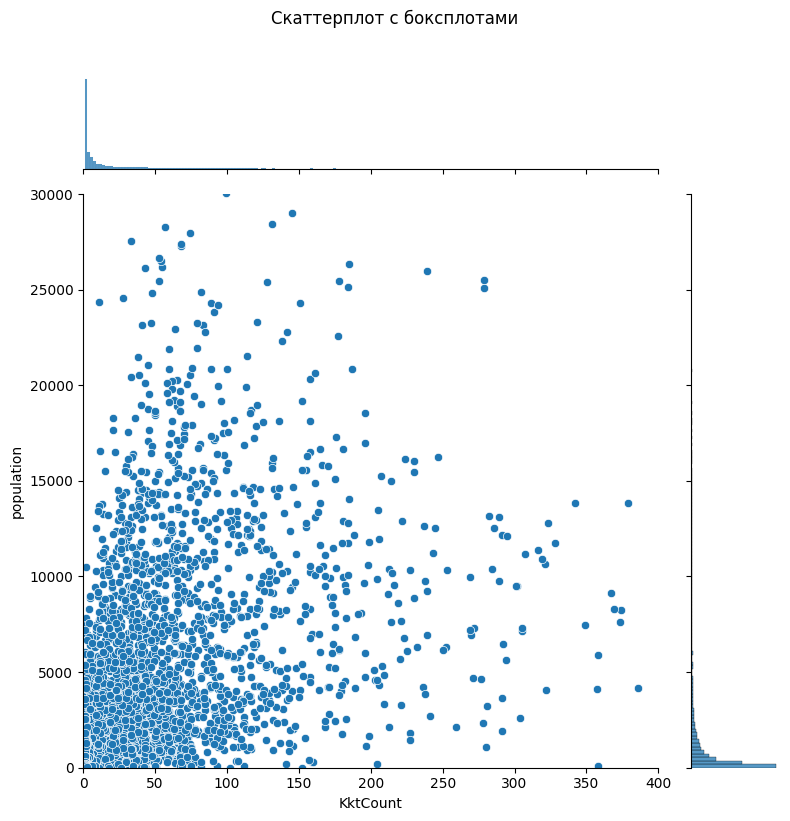

In [19]:
g = sns.jointplot(
    data=gdf,
    x='KktCount', 
    y='population',
    kind="scatter",
    height=8,
)

# Задаем желаемые лимиты осей
x_min, x_max = 0, 400  # пределы для оси X
y_min, y_max = 0, 30000  # пределы для оси Y


# Устанавливаем лимиты осей для скаттерплота
g.ax_joint.set_xlim(x_min, x_max)
g.ax_joint.set_ylim(y_min, y_max)

# Устанавливаем лимиты осей для боксплотов
g.ax_marg_x.set_xlim(x_min, x_max)
g.ax_marg_y.set_ylim(y_min, y_max)

g.fig.suptitle('Скаттерплот с боксплотами', y=1.02)
plt.tight_layout()
plt.show()

### Считаем суммарные признаки по соседям 

In [24]:
h3.k_ring(gdf['H3Id'].iloc[0], 1)

{'881181d701fffff',
 '881181d709fffff',
 '881181d70bfffff',
 '881181d70dfffff',
 '881181d743fffff',
 '881181d747fffff',
 '881181d755fffff'}

## EDA

### Первичная визуализация

In [26]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7913 entries, 0 to 7912
Data columns (total 47 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Id                      7913 non-null   object  
 1   H3Id                    7913 non-null   object  
 2   KktCount                7913 non-null   int64   
 3   AverageBill             3305 non-null   float64 
 4   TruncatedAverageBill    3305 non-null   float64 
 5   MedianBill              3305 non-null   float64 
 6   CacheBillPercent        3301 non-null   float64 
 7   CachePayPercent         3302 non-null   float64 
 8   IntensityOfNumberBills  7913 non-null   int64   
 9   RevenueIntensity        7913 non-null   int64   
 10  PeriodStart             7913 non-null   object  
 11  PeriodEnd               7913 non-null   object  
 12  IsMall                  7913 non-null   bool    
 13  IsRare                  7913 non-null   bool    
 14  IsEcommerce     

In [27]:
print(f"Количество категориальных атрибутов: {len(gdf.select_dtypes(include='object').columns)}")
print(f"Количество числовых атрибутов: {len(gdf.select_dtypes(exclude='object').columns)}")

Количество категориальных атрибутов: 8
Количество числовых атрибутов: 39


In [29]:
col_names = gdf.columns.str.lower()
col_names

Index(['id', 'h3id', 'kktcount', 'averagebill', 'truncatedaveragebill',
       'medianbill', 'cachebillpercent', 'cachepaypercent',
       'intensityofnumberbills', 'revenueintensity', 'periodstart',
       'periodend', 'ismall', 'israre', 'isecommerce', 'topcategories',
       'title', 'receipttotalcount', 'geometry', 'hour_0', 'hour_1', 'hour_2',
       'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'h3', 'population', 'class', 'color'],
      dtype='object')

In [30]:
new_col_names = [
       'id', 'h3id', 'kkt_count', 'avg_bill', 'truncated_avg_bill',
       'median_bill', 'cache_bill_percent', 'cache_pay_percent',
       'intensity_of_number_bills', 'revenue_intensity', 'period_start',
       'period_end', 'is_mall', 'is_rare', 'is_ecommerce', 'top_categories',
       'title', 'receipt_total_count', 'geometry', 'hour_0', 'hour_1', 'hour_2',
       'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'h3', 'population', 'class', 'color'
]

In [31]:
gdf.columns = new_col_names

In [32]:
gdf.head(3)

,id,h3id,kkt_count,avg_bill,truncated_avg_bill,median_bill,cache_bill_percent,cache_pay_percent,intensity_of_number_bills,revenue_intensity,...,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,h3,population,class,color
0,ac0c9890-1184-11f0-bb0a-005056a0313a,881181d709fffff,6,1141.0,607.0,460.0,39.0,22.0,8,9,...,7.6,7.4,6.7,4.7,2.1,0.3,881181d709fffff,594.0,0,"rgba(68, 1, 84, 1.00)"
1,a3f70574-1183-11f0-9565-005056a0313a,88118ddb29fffff,3,NaN,NaN,NaN,NaN,NaN,6,5,...,10.3,10.7,0.3,0.0,0.4,0.1,88118ddb29fffff,169.0,0,"rgba(68, 1, 84, 1.00)"
2,abf8db16-1184-11f0-bb0a-005056a0313a,8811819223fffff,2,NaN,NaN,NaN,NaN,NaN,7,7,...,9.4,7.5,5.5,1.5,0.1,0.0,8811819223fffff,182.0,0,"rgba(68, 1, 84, 1.00)"


In [52]:
def plot_eda(df, col, bins=100):
    plt.figure(figsize=(15, 3))
    
    sns.histplot(df[col], bins=bins, kde=True)
    plt.ylabel("Количество наблюдений")
    plt.title(f"Гистограмма распределения признака {col}\n")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(15, 1))
    sns.boxplot(x=df[col], fill=False)
    plt.title(f"Диаграмма размаха признака {col}\n")
    # plt.tight_layout()
    plt.show()

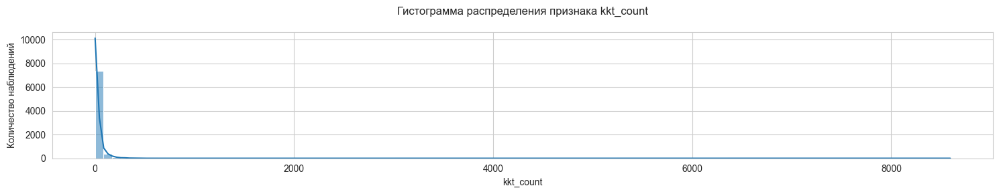

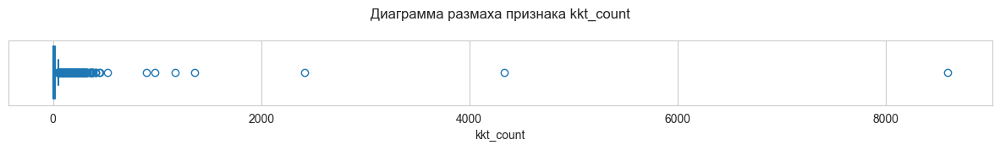

In [53]:
plot_eda(gdf, 'kkt_count')

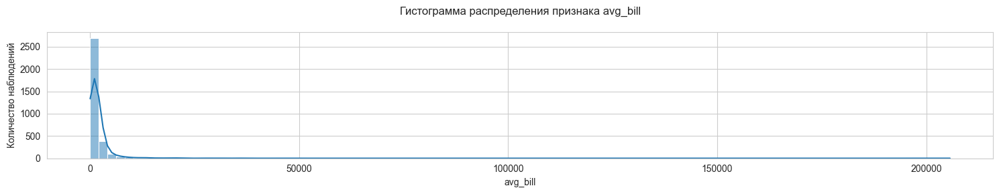

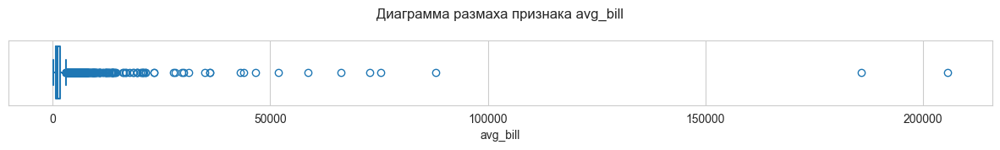

In [54]:
plot_eda(gdf, 'avg_bill')

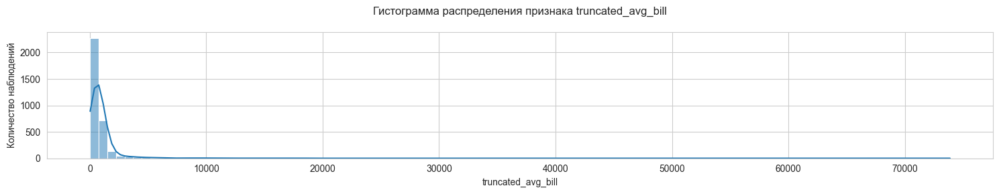

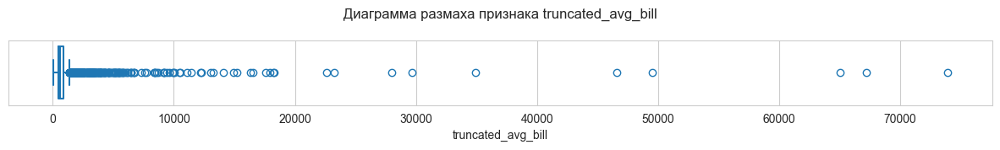

In [58]:
plot_eda(gdf, 'truncated_avg_bill')

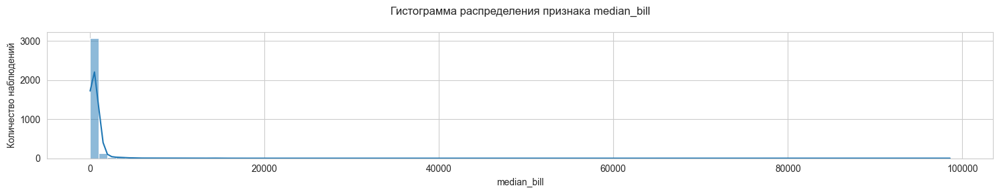

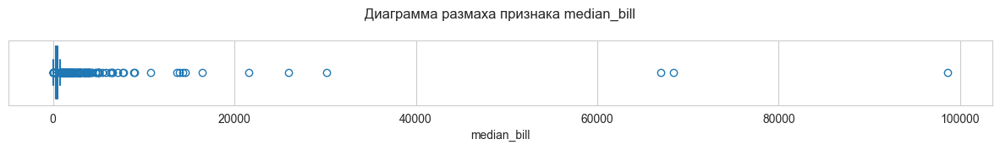

In [59]:
plot_eda(gdf, 'median_bill')

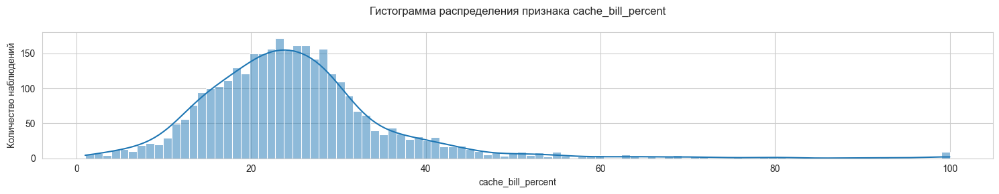

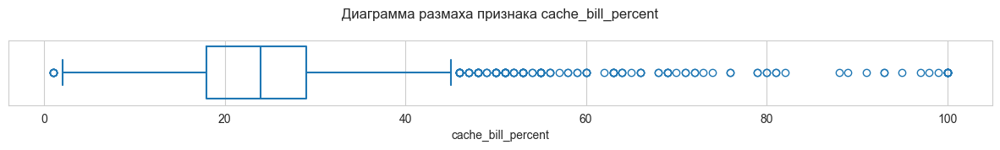

In [60]:
plot_eda(gdf, 'cache_bill_percent')

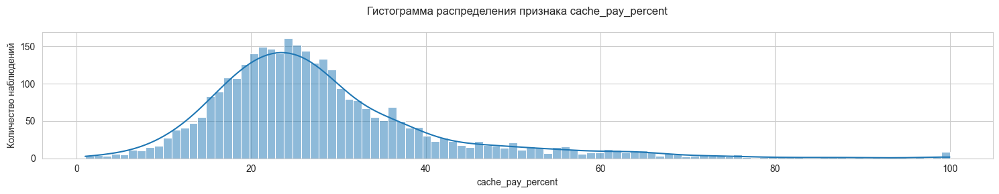

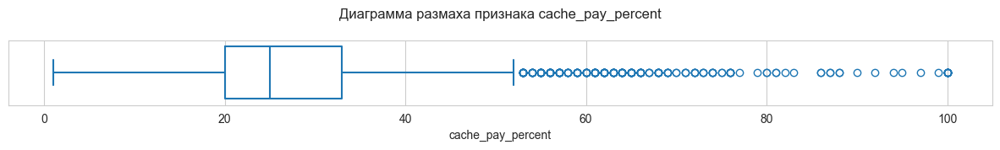

In [62]:
plot_eda(gdf, 'cache_pay_percent')

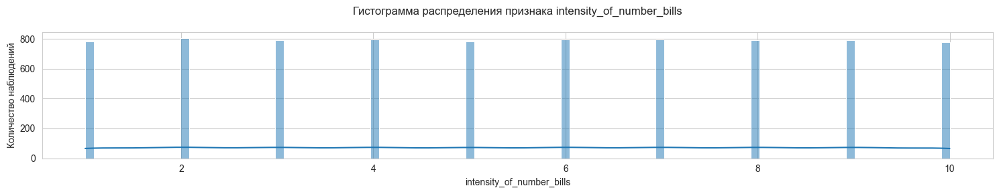

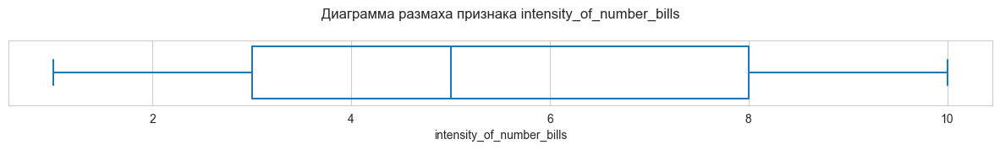

In [63]:
plot_eda(gdf, 'intensity_of_number_bills')

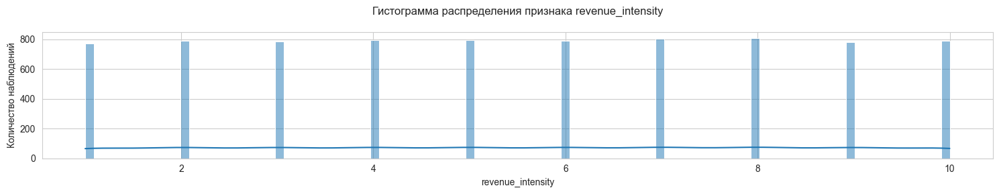

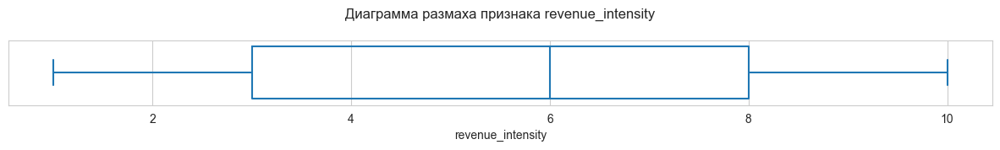

In [64]:
plot_eda(gdf, 'revenue_intensity')

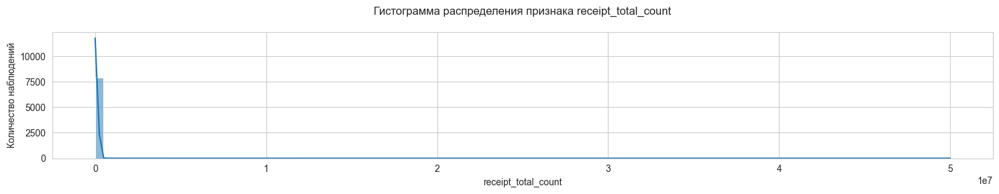

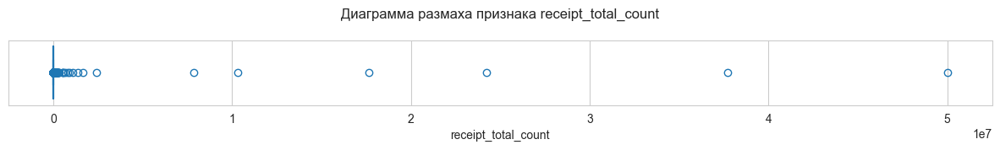

In [70]:
plot_eda(gdf, 'receipt_total_count')

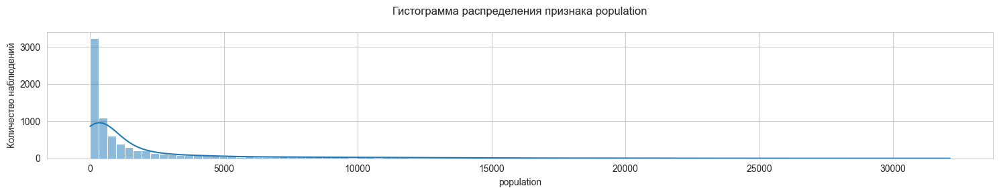

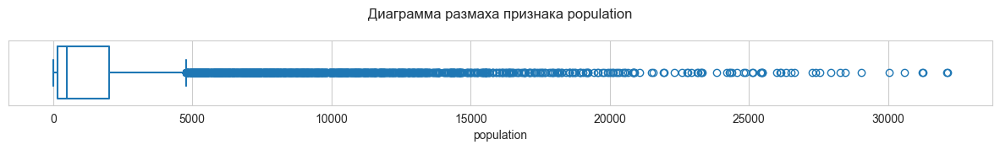

In [71]:
plot_eda(gdf, 'population')

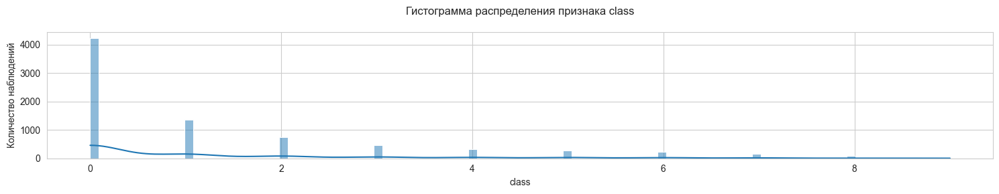

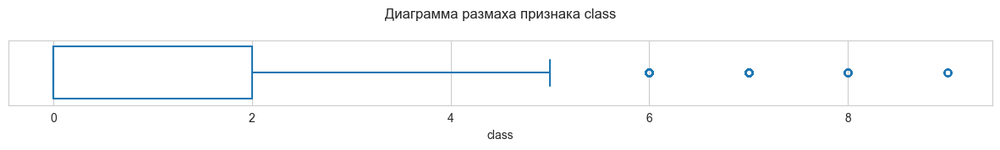

In [72]:
plot_eda(gdf, 'class')